<a href="https://colab.research.google.com/github/cyu1221/MachineLearningCourse/blob/master/Charlenetest.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Datadog Growth Strategy Analyst Case study Q2
###Name: Charlene Yu
###Date: Jan 25th, 2021

# 0.Summary and Conclusion

# **Background:**

The number of weekly pageviews in the application dramatically decreased in early May 2019. It never came back to its original order of magnitude since then.


# **Conclusion:**
The given information helped me identify 167 users who had significant decline in pageviews in early May. However, the given information is insufficient to conclude the root cause behind the decline.

**1. Profiling:** Users/companies accessed fewer urls. Those companies and users contributing to the pageview drop were likely to have the following traits:
>* Heavy dashboard users
>* From US, Argentina, and India
>* Have Pro, enterprise or free account.
>* Have been with Datadog one year or less 

**2. Potential reasons behind the pageview decline:**
>* Certain companies/users could no longer use their accounts.
>* New features were introduced to dashboards as old features no longer existed. Thus, users did not need to access new urls/pages for the same amount of information.
>* Auto-refresh accounted for a small fraction of the pageview decrease.
>* Data was incomplete.

# **Recommendations:**

**A. To increase pageviews and other user activities, I recommend the following:**
1. Investigate each customer cluster and analyze their pageview pattern. (see section 4.2)
2. Investigate the root cause behind each key observation.
3. Create a new URL for each click.
4. Track and incentivize user activities because 44% of users created one pageview. 59% of users viewed one url.

**B. To better monitor user activities through data analysis, I recommend the following:**
1. Adding new variables: 
* session length, account status, account expiration/renewal date , company type
2. Modifing existing variables:
* reduce missing data on app subcategory column
* link all the users to company to better monitor active user ratios
* normalize user's input on user_type (e.g, software engineer)

# **Key Observations:**
1. Existing users (who had already viewed a page in the given dataset) contributed to the pageviews drop.
2. New users (who created a pageview for the first time in the given dataset) had relatively stable pageview trends. 
3. 5/13/2019 week has the lowest average user retention rate for the second day.
2. Companies with high pageviews reduced their pageviews expiration/renewal date starting 5/13/2019 week. Companies accessing large number of urls had viewed far less urls starting 5/13/2019 week.
3. Number of urls has a positive correlation with pageviews. The average view per url decreased from 1.25 to 1.1 from April to May.
4. The ratio of users per company stayed relatively unchanged.

# 1.Data Loading and Cleaning

In [ ]:
import numpy as np
import pandas as pd
import warnings
from tqdm import tqdm
from datetime import datetime, timedelta
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from __future__ import division
import plotly
import plotly.offline as pyoff
import plotly.graph_objs as go

In [ ]:
from matplotlib import pyplot
import plotly.express as px
import plotly.graph_objects as go

In [ ]:
dim_app_page = pd.read_csv('dim_app_page.csv')
dim_customer_company = pd.read_csv('dim_customer_company.csv')
dim_user = pd.read_csv('dim_user.csv')
fact_app_pageview = pd.read_csv('fact_app_pageview.csv')

#rename columns
dim_app_page=dim_app_page.add_prefix('app_page_')
dim_customer_company=dim_customer_company.add_prefix('customer_company_')
dim_user=dim_user.add_prefix('user_')

### 1.1 Merge tables

In [ ]:
#merge 4 tables to create a master df
df= fact_app_pageview.merge(dim_user,left_on='datadog_user_id', right_on='user_id').merge(dim_customer_company,left_on='company_id', right_on='customer_company_id').merge(dim_app_page,left_on='page_id', right_on='app_page_id')

#drop duplicated columns
df.drop(['user_id', 'customer_company_id','app_page_id'], axis=1, inplace=True)

### 1.2 Datetime Transformation

In [ ]:
import datetime
from datetime import datetime
#change column type to datetime
def change_to_datetime(df, columnname):
  df[columnname]= pd.to_datetime(df[columnname])

change_to_datetime(df, 'pageview_timestamp')
change_to_datetime(df, 'user_created_timestamp')
change_to_datetime(df, 'customer_company_signup_timestamp')

In [ ]:
from datetime import timezone 
#change to UTC time
for index, row in df.iterrows():
  row['pageview_timestamp']=row['pageview_timestamp'].replace(tzinfo = timezone.utc)

#add new column calculting enrollment period from company_sign_up_time to pageview_timestamp (converting all datetime to UTC time)
df['company_enrolled_period'] = df.apply (lambda x: x['pageview_timestamp'].replace(tzinfo = timezone.utc) - x['customer_company_signup_timestamp'].replace(tzinfo = timezone.utc) , axis=1)
#add new column calculting enrollment period from user_sign_up_time to pageview_timestamp (converting all datetime to UTC time)
df['user_enrolled_period'] = df.apply (lambda x: x['pageview_timestamp'].replace(tzinfo = timezone.utc) - x['user_created_timestamp'].replace(tzinfo = timezone.utc) , axis=1)

In [ ]:
#Convert columns to date/no. of days
df['pageview_date']=df['pageview_timestamp'].dt.date
df['company_enrolled_period']=df['company_enrolled_period'].dt.days
df['user_enrolled_period']=df['user_enrolled_period'].dt.days
df.columns

In [ ]:
#save table for future use
df.to_csv('df.csv', index=False)

### 1.3 Check .is_unique/.isnull()

In [ ]:
#Check uniqueness/na
print('dim_app_page:')
print(pd.Series(dim_app_page["id"]).is_unique)
print(dim_app_page["category"].isnull().sum()) #count NA
print(dim_app_page["subcategory"].isnull().sum()) #count NA

print( "\n"+'dim_user:')
print(pd.Series(dim_user["id"]).is_unique)
print(pd.Series(dim_user["name"]).is_unique)
print(dim_user["role"].isnull().sum()) #count NA
print(dim_user["created_timestamp"].isnull().sum()) #count NA


print("\n"+'dim_customer_company:')
print(pd.Series(dim_customer_company["id"]).is_unique)
print(pd.Series(dim_customer_company["name"]).is_unique)
print(dim_customer_company["billing_plan"].isnull().sum()) #count NA
print(dim_customer_company["signup_timestamp"].isnull().sum()) #count NA
#What is "Expired" under Billing Column?

print("\n"+'fact_app_pageview:')
print(pd.Series(fact_app_pageview["pageview_id"]).is_unique)
print(fact_app_pageview["source"].isnull().sum()) #count NA
print(fact_app_pageview["page_id"].isnull().sum()) #count NA
#note: in fact_app_pageview, datadog_user_id, company_id, page_url, page_id are not unique. 


dim_app_page:
True
0
8

dim_user:
True
False
4884
0

dim_customer_company:
True
False
0
0

fact_app_pageview:
True
24395
0


In [ ]:
#Company Analysis:
# Company vs. Sources: Most sources (starting with comapny names) belong to 1 company. Sources like app.datadog, google, github have different company ID accessing them. 

#df.groupby(['source','company_id']).size()

##No. of active customers per month and its bar plot:

In [ ]:
#!pip install pivottablejs
#from pivottablejs import pivot_ui
#from IPython.display import HTML
#interactive Pivot Table
#df_vis = df[['pageview_id',  'datadog_user_id', 'company_id',
#       'geo_country', 'page_url', 'page_id', 'source', 'user_name', 
#       'user_created_timestamp', 'customer_company_name','customer_company_billing_plan', 
#       'app_page_category', 'app_page_subcategory', 'enrolled_period',
#       'pageview_date']]
#pivot_ui(df_vis, outfile_path='pivottablejs.html')
#HTML('pivottablejs.html')

### Reload df

In [ ]:
#Reload df
df = pd.read_csv('df.csv')
df.columns

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (15) have mixed types.Specify dtype option on import or set low_memory=False.



Index(['pageview_id', 'pageview_timestamp', 'datadog_user_id', 'company_id',
       'geo_country', 'page_url', 'page_id', 'source', 'user_name',
       'user_role', 'user_created_timestamp', 'customer_company_name',
       'customer_company_billing_plan', 'customer_company_signup_timestamp',
       'app_page_category', 'app_page_subcategory', 'company_enrolled_period',
       'user_enrolled_period', 'pageview_date'],
      dtype='object')

# 2.EDA, Visualizations

## 2.1 By user / company 

### graph functions

In [ ]:
import plotly.io as pio
pio.renderers.keys()
pio.renderers.default = 'colab'

dict_keys(['plotly_mimetype', 'jupyterlab', 'nteract', 'vscode', 'notebook', 'notebook_connected', 'kaggle', 'azure', 'colab', 'cocalc', 'databricks', 'json', 'png', 'jpeg', 'jpg', 'svg', 'pdf', 'browser', 'firefox', 'chrome', 'chromium', 'iframe', 'iframe_connected', 'sphinx_gallery'])

In [ ]:
#functions

##plot for 1 column
def plot_daily(df, column_name1):
  plot_data = [ go.Scatter(
      x=df['pageview_date'],
      y=df[column_name1],)]
  plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Daily '+column_name1 ,)
  fig = go.Figure(data=plot_data, layout=plot_layout)
  pyoff.iplot(fig)

##subplots for 2 categories/columns
from plotly.subplots import make_subplots
def sublot_daily(df, column_name1, column_name2 ):
  fig = make_subplots(specs=[[{"secondary_y": True}]])

# Add traces
  fig.add_trace(go.Scatter( x=df['pageview_date'],y=df[column_name1], name=column_name1+ " data"),
      secondary_y=False,)
  
  if column_name2=='avg_view_per_url':
    fig.add_trace(go.Scatter(x=df['pageview_date'],y=df[column_name2], name=column_name2+ " data"),
      secondary_y=True,)
  else:
    fig.add_trace(go.Scatter(x=df['pageview_date'],y=df[column_name2], name=column_name2+ " data"),
      secondary_y=False,)

# Add figure title
  fig.update_layout(
      title_text="Daily Activities  "+ column_name1 + "  and  " + column_name2)
  
# Set x-axis title
  fig.update_xaxes(title_text="Dates")

# Set y-axes titles
  if column_name2=='avg_view_per_url':
    fig.update_yaxes(title_text= column_name1 , secondary_y=True)
    fig.update_yaxes(title_text= column_name2 , secondary_y=True)
  else:
    fig.update_yaxes(title_text= "ID Counts", secondary_y=False)

  #plotlyfig2json(fig, 'myfile.json')
  #plotlyfromjson('myfile.json')
  fig.show()

##Histogram
#fig = px.histogram(df, x="pageview_date", y="pageview_id", histfunc="count", title="Histogram on Date Axes")
#fig.update_layout(bargap=0.1)
#fig.show()


### active users/companies

In [ ]:
#creating daily active user, company, pageviews, sources, page_urls dataframe by counting unique IDs
daily_active = df.groupby('pageview_date')['datadog_user_id', 'pageview_id', 'company_id', 'page_url','source'].nunique().reset_index()
daily_active.columns = ['pageview_date', 'datadog_user_count', 'pageview_count', 'company_count', 'url_count','source_count' ]

#create avg view per user, avg_view_per_url, unqiue_pageview columns
daily_active['avg_view_per_user']=daily_active['pageview_count']/daily_active['datadog_user_count']
daily_active['avg_view_per_url']=daily_active['pageview_count']/daily_active['url_count']
daily_active['unqiue_pageview']=daily_active['url_count']/daily_active['pageview_count']

daily_active.head(2)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,pageview_date,datadog_user_count,pageview_count,company_count,url_count,source_count,avg_view_per_user,avg_view_per_url,unqiue_pageview
0,2019-04-15,326,4475,217,3355,45,13.726994,1.333830,0.749721
1,2019-04-16,329,5606,222,4381,45,17.039514,1.279617,0.781484


A. First graph indicates that the number of users and companies remain relatively stable from April to June. Retention analysis will show more information on users.

In [ ]:
sublot_daily(daily_active, column_name1='datadog_user_count', column_name2='company_count')

## 2.2 By unqiue pageview

The graph below shows there is a correlation between the number of urls and pageviews. Users view the same url more often (due to manual/auto refresh, or click the same url repeatedly). After may, the url count grew closer to pageview count. It meant that users are likely to view each url once per day.

In [ ]:
sublot_daily(daily_active, column_name1='pageview_count', column_name2='url_count')
####This graph shows the number of urls is correlated with pageview counts yet before may,
####users view the same url more often (due to manual/auto refresh, or click the same url repeatedly).
####After may, the url count grows closer to pageview count. It means that users are likely to view each url once per day.

C. Simple Moving Average (SMA) uses a sliding window to take the average over a set number of time periods. It is an equally weighted mean of the previous n data.

Around 80% of all views is unique pageview in April. In May, the percentage of unique pageviews increases to 88% overtime. 
It confirms my theory that after May, users were likely to view each url once per day.

The moving average in orange shows the increasing trend. 

In [ ]:
#Simple Moving Average (SMA) for 4 days window periods.
daily_active['SMA_4_unqiue_pageview'] = daily_active.iloc[:,8].rolling(window=4).mean()
sublot_daily(daily_active, column_name1='unqiue_pageview', column_name2='SMA_4_unqiue_pageview')

### Hypothesis Testing: non unique pageviews 

Hypothesis: The decrease in non unique pageviews led to 100% of the pageview decrease. 
 
Result: Reject. The graph shows siginificant pageview decrease in early May after removing non unique pageviews. Therefore, non unique pageviews (e.g., viewing each url mutiple times, auto-refresh) is not the main cause of pageview decrease.


In [ ]:
###  Hypothesis Test: Removing not unique views
## 1. Identify the urls that were viewed twice by the same user on a given day.
## 2. Remove those pageviews from the master df and create a dataframe that only consists of unique pageviews for a given day
## 3. Graph the remaining pageviews
## 4. If the graph does not show the pageview decrease, then viewing each url mutiple times (e.g., auto-refresh) is not the cause of the decrease.

url_pageview = df.groupby(['page_url','pageview_date', 'datadog_user_id'])['pageview_id'].nunique().reset_index()
url_pageview.head()

criteria = url_pageview[ url_pageview['pageview_id']>= 2 ] 

criteria["concat"] = criteria["pageview_date"] + criteria["page_url"] + criteria["datadog_user_id"] 
df_concat=df[['pageview_id', 'pageview_timestamp', 'datadog_user_id',
       'geo_country', 'page_url', 'page_id', 'source', 'user_name',  
       'customer_company_billing_plan', 'customer_company_signup_timestamp',
       'app_page_category','pageview_date']]
df_concat["concat"] = df_concat["pageview_date"] + df_concat["page_url"] + df_concat["datadog_user_id"] 

a=criteria["concat"]
df_test = df_concat[~df_concat['concat'].isin(a)]

fig = px.histogram(df_test, x="pageview_date", y="pageview_id", histfunc="count", title="Histogram on Date Axes")
fig.update_layout(bargap=0.1)
fig.show()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



## 2.3 By company type

In [ ]:
import math
df['company_enrolled_period'].describe()
#identify how many years has the company been with Datadog 
# 1.0 means the company has been with Datadog one year or less
# 2.0 means the company has been with Datadog 1-2 years
df['company_seniority'] = np.ceil((df['company_enrolled_period']/365).values )
df['user_seniority'] = np.ceil((df['user_enrolled_period']/365).values )

#calculate the pageview per month for each company seniority
company_seniority_pageview = df.groupby(['pageview_date','company_seniority'])['pageview_id','datadog_user_id'].nunique().reset_index()
#company_seniority_pageview.head(2)

#calculate the pageview per month for each user seniority
user_seniority_pageview = df.groupby(['pageview_date','user_seniority'])['pageview_id','datadog_user_id'].nunique().reset_index()
#user_seniority_pageview.head(5)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:10: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



A. First plot, Companies have been with datadog 1 year or less, and 3-4 years have the most overall pageviews. All company trends (based on seniority) follow the similar trend as the overall pageview trend.

B. Second plot, users have been with datadog 1 year or less have the most overall pageviews. Users 1 years or younger have the most drastic pageview decrease in early May.

In [ ]:
plot_data = [
    go.Scatter(
        x=company_seniority_pageview.query("company_seniority == 2.0")['pageview_date'],
        y=company_seniority_pageview.query("company_seniority == 2.0")['pageview_id'],
        name = '1-2 years'),
    go.Scatter(
        x=company_seniority_pageview.query("company_seniority == 1.0")['pageview_date'],
        y=company_seniority_pageview.query("company_seniority == 1.0")['pageview_id'],
        name = '1 year or less'),
    go.Scatter(
        x=company_seniority_pageview.query("company_seniority == 3.0")['pageview_date'],
        y=company_seniority_pageview.query("company_seniority == 3.0")['pageview_id'],
        name = '2-3 years'),
    go.Scatter(
        x=company_seniority_pageview.query("company_seniority == 4.0")['pageview_date'],
        y=company_seniority_pageview.query("company_seniority == 4.0")['pageview_id'],
        name = '3-4 years'),
    go.Scatter(
        x=company_seniority_pageview.query("company_seniority in [5.0, 6.0, 7.0, 8.0, 9.0, 10.0]")['pageview_date'],
        y=company_seniority_pageview.query("company_seniority in [5.0, 6.0, 7.0, 8.0, 9.0, 10.0]")['pageview_id'],
        name = '5+ years')
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='pageview counts/trends based on company age')
fig = go.Figure(data=plot_data, layout=plot_layout)
fig.update_yaxes(title_text= "pageview_id trends")
pyoff.iplot(fig)

plot_data = [
    go.Scatter(
        x=user_seniority_pageview.query("user_seniority == 2.0")['pageview_date'],
        y=user_seniority_pageview.query("user_seniority == 2.0")['pageview_id'],
        name = '1-2 years'),
    go.Scatter(
        x=user_seniority_pageview.query("user_seniority == 1.0")['pageview_date'],
        y=user_seniority_pageview.query("user_seniority == 1.0")['pageview_id'],
        name = '1 year or less'),
    go.Scatter(
        x=user_seniority_pageview.query("user_seniority == 3.0")['pageview_date'],
        y=user_seniority_pageview.query("user_seniority == 3.0")['pageview_id'],
        name = '2-3 years'),
    go.Scatter(
        x=user_seniority_pageview.query("user_seniority == 4.0")['pageview_date'],
        y=user_seniority_pageview.query("user_seniority == 4.0")['pageview_id'],
        name = '3-4 years'),
    go.Scatter(
        x=user_seniority_pageview.query("user_seniority in [5.0, 6.0, 7.0, 8.0, 9.0]")['pageview_date'],
        y=user_seniority_pageview.query("user_seniority in [5.0, 6.0, 7.0, 8.0, 9.0]")['pageview_id'],
        name = '5+ years')
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='pageview counts/trends based on user age')
fig = go.Figure(data=plot_data, layout=plot_layout)
fig.update_yaxes(title_text= "pageview_id trends")
pyoff.iplot(fig)

## 2.4 By other categories

Dashboard pageviews, 2 categories of page_id pageviews contributed to the overall pageview drop.

In [ ]:
def Plot_Scatter_Plot(category, df):
  df2 = df.pivot_table( values="pageview_id", index=['pageview_date'], columns=category, aggfunc='size')
  fig = go.Figure()
  for col in df2.columns:
    fig.add_trace(go.Scatter(x=df2.index, y=df2[col].values,
                             name = col,
                             mode = 'markers+lines',
                             line=dict(shape='linear'),
                             connectgaps=True))
  fig.show()

Plot_Scatter_Plot(['app_page_category'],df)
Plot_Scatter_Plot(['page_id'],df)
Plot_Scatter_Plot(['customer_company_billing_plan'],df)
Plot_Scatter_Plot(['geo_country'],df)

## 2.5 single pageview/url

56.24% of users created more than one pageview.
43.76% of users created more than one pageview.

40.85% of users viewed more than one url.
59.15% of users viewed more than one url.

56.24% of users created more than one pageview.
43.76% of users created one pageview.

40.85% of users viewed more than one url.
59.15% of users viewed one url.



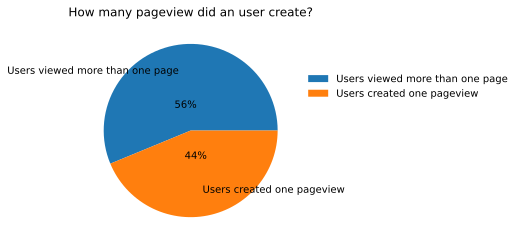

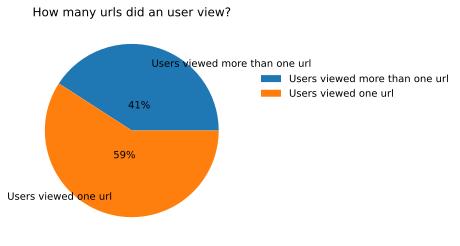

In [ ]:
n_orders = df.groupby(['datadog_user_id'])['pageview_id'].nunique()
mult_view_perc = np.sum(n_orders > 1) / df['datadog_user_id'].nunique()
print(f'{100 * mult_view_perc:.2f}% of users created more than one pageview.')
print(f'{100 * (1- mult_view_perc):.2f}% of users created one pageview.')
print()

fig, ax = plt.subplots()
labels = ['Users viewed more than one page', 'Users created one pageview']
percentages = [mult_view_perc, 1-mult_view_perc]
explode=(0.1,0)
ax.pie(percentages,  labels=labels,  autopct='%1.0f%%', startangle=0,   pctdistance=0.3,labeldistance=0.7)

ax.set_title("How many pageview did an user create?")
ax.legend(frameon=False, bbox_to_anchor=(2,0.8))
#################################################################################
n_orders = df.groupby(['datadog_user_id'])['page_url'].nunique()
mult_view_perc = np.sum(n_orders > 1) / df['datadog_user_id'].nunique()
print(f'{100 * mult_view_perc:.2f}% of users viewed more than one url.')
print(f'{100 * (1- mult_view_perc):.2f}% of users viewed one url.')
print()

fig, ax = plt.subplots()
labels = ['Users viewed more than one url', 'Users viewed one url']
percentages = [mult_view_perc, 1-mult_view_perc]
explode=(0.1,0)
ax.pie(percentages,  labels=labels,  autopct='%1.0f%%', startangle=0,   pctdistance=0.3,labeldistance=0.8)

ax.set_title("How many urls did an user view?")
ax.legend(frameon=False, bbox_to_anchor=(2,0.8))

### Correlation Matrix

In [ ]:
###Correlation Matrix 
### The correlation between tested variables are too low to be considered. 

#df.groupby([ 'page_id']).pageview_id.nunique().reset_index()
#get the max purchase date for each customer and create a dataframe with it
df1= df.groupby('datadog_user_id').pageview_id.nunique().reset_index()
df1.columns = ['datadog_user_id','pageview_count']

df2= df.groupby('datadog_user_id').enrolled_period.min().reset_index()
df1=pd.merge(df1, df2, on='datadog_user_id')

df4=pd.crosstab(df['datadog_user_id'], df['page_id']).reset_index()
df1=pd.merge(df1, df4, on='datadog_user_id')
df1

df11=df[['datadog_user_id',''customer_company_billing_plan'z']]
#'customer_company_billing_plan',
df12= df11.groupby('datadog_user_id')
df12.head()

plt.figure(figsize = (16,5))
sns.heatmap(df1.corr(), annot=True,linewidths=.5)

# 3.Retention


Retention rate indicates gives a number to the percentage of users who still use an app a certain number of days after install. Daily Retention Rate is visualized to calculate how many customers retained from previous day. (https://www.adjust.com/glossary/retention-rate/ )

## 3.1 First/second half pageviews analysis

In [ ]:
def rentention(df, columnname):

  #identify which users are active by looking at their pageviews per month
  column_pageview = df.groupby([columnname, 'pageview_date'])['pageview_id'].nunique().reset_index() 
  #create retention matrix with crosstab
  rentention_column = pd.crosstab(column_pageview[columnname], column_pageview['pageview_date'],
                                  values=column_pageview['pageview_id'], aggfunc='sum').reset_index() 
  rentention_column.fillna(0, inplace=True)
  
  rentention_column['second_half']= rentention_column.iloc[:, -24:].sum(axis=1)
  rentention_column=pd.merge(rentention_column, column_pageview[[columnname,'pageview_id']], on=[columnname])
  rentention_column['first_half'] =rentention_column['pageview_id'] -rentention_column['second_half']
  rentention_column['ratio'] =rentention_column['first_half'] /rentention_column['pageview_id']
  
  print('Out of a total of  ' + str(rentention_column['pageview_id'].sum()) +' pageviews from '+ str(len(rentention_column))+ ' '+ columnname +'.')
  #users/companies/urls who were active ONLY in the first half
  print( str(len(rentention_column.query('0 == second_half').index)) + ' '+ columnname +' created pageviews in the first half (before 5/9/2019). '
  + 'Their pageviews accounted for ' + "%.2f%%" %(100*rentention_column.query('0 == second_half')['pageview_id'].sum()/rentention_column['pageview_id'].sum()) 
  +' of the total pageview.')

  #users/companies/urls who were active ONLY in the second half
  print( str(len(rentention_column.query('0 == first_half').index)) + ' '+ columnname +' created pageviews in the second half (after 5/9/2019). '
  + 'Their pageviews accounted for ' + "%.2f%%" % (100*rentention_column.query('0 == first_half')['pageview_id'].sum()/rentention_column['pageview_id'].sum()) 
  +' of the total pageview.')
  print() 
  return rentention_column

In [ ]:
rentention(df, 'page_url')
rentention(df, 'datadog_user_id')
rentention(df, 'company_id')

Out of a total of  168747 pageviews from 139817 page_url.
109042 page_url created pageviews in the first half (before 5/9/2019). Their pageviews accounted for 78.15% of the total pageview.
28970 page_url created pageviews in the second half (after 5/9/2019). Their pageviews accounted for 17.84% of the total pageview.

Out of a total of  168747 pageviews from 13675 datadog_user_id.
3436 datadog_user_id created pageviews in the first half (before 5/9/2019). Their pageviews accounted for 27.54% of the total pageview.
2250 datadog_user_id created pageviews in the second half (after 5/9/2019). Their pageviews accounted for 2.31% of the total pageview.

Out of a total of  168747 pageviews from 8765 company_id.
897 company_id created pageviews in the first half (before 5/9/2019). Their pageviews accounted for 2.35% of the total pageview.
817 company_id created pageviews in the second half (after 5/9/2019). Their pageviews accounted for 1.06% of the total pageview.



,company_id,2019-04-15,2019-04-16,2019-04-17,2019-04-18,2019-04-19,2019-04-20,2019-04-21,2019-04-22,2019-04-23,2019-04-24,2019-04-25,2019-04-26,2019-04-27,2019-04-28,2019-04-29,2019-04-30,2019-05-01,2019-05-02,2019-05-03,2019-05-04,2019-05-05,2019-05-06,2019-05-07,2019-05-08,2019-05-09,2019-05-10,2019-05-11,2019-05-12,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22,2019-05-23,2019-05-24,2019-05-25,2019-05-26,2019-05-27,2019-05-28,2019-05-29,2019-05-30,2019-05-31,2019-06-01,2019-06-02,second_half,pageview_id,first_half,ratio
0,002b4e60cd0284743d8b31d8d940b5ef93278e907394d7...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1,1.0,1.0
1,002d876bd01638236265cbab5317d959425f471554f4a9...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,3.0,1.0
2,003497f6473fb932fe40dacb010c8199cf6b3154b1df8a...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1,0.0,0.0
3,0068ddd8e47ab6467d5a6030ff131bd5f0d26ddc6deb81...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.0,1,-34.0,-34.0
4,0068ddd8e47ab6467d5a6030ff131bd5f0d26ddc6deb81...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,35.0,35,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8760,ffc37b77d6a4153facc664e3e008889943a181118a413c...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3,0.0,0.0
8761,ffd4f5d69571dd338f395617e2b0de146376e20de1db89...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19,19.0,1.0
8762,ffd4f5d69571dd338f395617e2b0de146376e20de1db89...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,19.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2,2.0,1.0
8763,fff8ccd4002b1fe24fbf8bd38ebc8c569d08a7b3e28dbf...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,2.0,1,-1.0,-1.0


## 3.2 New Customer Ratio

The data shows that existing customer is decreasing significantly.  This leads us to rentention analysis. 
(https://towardsdatascience.com/data-driven-growth-with-python-part-1-know-your-metrics-812781e66a5b)

In [ ]:
#create a dataframe contaning CustomerID and first view date
min_pageview = df.groupby('datadog_user_id').pageview_date.min().reset_index()
min_pageview.columns = ['datadog_user_id','min_pageview_date']
#min_pageview['MinPurchaseYearMonth'] = min_pageview['min_pageview_date'].map(lambda date: 100*date.year + date.month)

#create a dataframe contaning CustomerID and last view date
max_pageview = df.groupby('datadog_user_id').pageview_date.max().reset_index()
max_pageview.columns = ['datadog_user_id','max_pageview_date']

#merge first purchase date column to our main dataframe (tx_uk)
df_min_max = pd.merge(df, min_pageview, on='datadog_user_id')
df_min_max = pd.merge(df_min_max, max_pageview, on='datadog_user_id')

#create a column called User Type and assign Existing 
#if User's First Purchase Year Month before the selected Invoice Year Month
df_min_max['UserType'] = 'New'
df_min_max.loc[df_min_max['pageview_date'] > df_min_max['min_pageview_date'],'UserType'] = 'Existing'

#calculate the Revenue per month for each user type
tx_user_type_pageview = df_min_max.groupby(['pageview_date','UserType'])['pageview_id'].nunique().reset_index()

#filtering the dates and plot the result
plot_data = [
    go.Scatter(
        x=tx_user_type_pageview.query("UserType == 'Existing'")['pageview_date'],
        y=tx_user_type_pageview.query("UserType == 'Existing'")['pageview_id'],
        name = 'Existing'
    ),
    go.Scatter(
        x=tx_user_type_pageview.query("UserType == 'New'")['pageview_date'],
        y=tx_user_type_pageview.query("UserType == 'New'")['pageview_id'],
        name = 'New'
    )
] 

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='New vs Existing'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

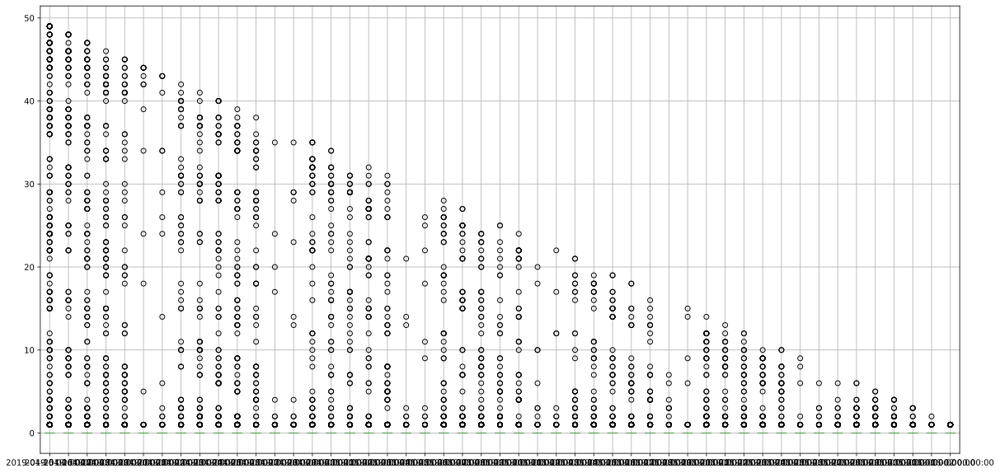

In [ ]:
df_min_max.min_pageview_date = pd.to_datetime(df_min_max.min_pageview_date, format='%Y/%m/%d')
df_min_max.max_pageview_date = pd.to_datetime(df_min_max.max_pageview_date, format='%Y/%m/%d')

df_min_max['active_period'] = (df_min_max['max_pageview_date'] - df_min_max['min_pageview_date']).dt.days + 1

user_min_max=df_min_max.groupby(['min_pageview_date', 'datadog_user_id'])['active_period'].max().reset_index()
user_period= pd.crosstab(user_min_max['datadog_user_id'], user_min_max['min_pageview_date'],
         values=user_min_max['active_period'], aggfunc='sum').reset_index()
user_period.fillna(0, inplace=True)
user_period
plt.figure(figsize=(20,10))
user_period.boxplot()
plt.show()

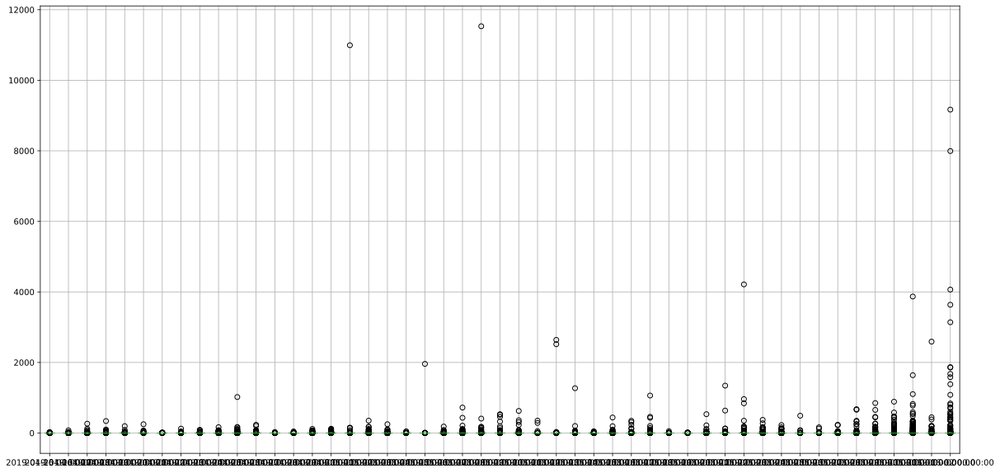

In [ ]:
df_min_max.min_pageview_date = pd.to_datetime(df_min_max.min_pageview_date, format='%Y/%m/%d')
df_min_max.max_pageview_date = pd.to_datetime(df_min_max.max_pageview_date, format='%Y/%m/%d')

df_min_max['active_period'] = (df_min_max['max_pageview_date'] - df_min_max['min_pageview_date']).dt.days + 1

user_min_max=df_min_max.groupby(['max_pageview_date', 'datadog_user_id'])['pageview_id'].nunique().reset_index()
user_period= pd.crosstab(user_min_max['datadog_user_id'], user_min_max['max_pageview_date'],
         values=user_min_max['pageview_id'], aggfunc='sum').reset_index()
user_period.fillna(0, inplace=True)
user_period
plt.figure(figsize=(20,10))
user_period.boxplot()
plt.show()

## 3.3 Weekly Retention

In [ ]:
mater_retention = pd.DataFrame(columns=['pageview_week', 'total_user_count', 
                                        'retained_user_count','retention_rate',  
                                        'company_seniority'])

for a in ["company_seniority == 1.0", "company_seniority == 4.0", 
          "company_seniority == 3.0", "company_seniority in [4.0, 5.0, 6.0, 7.0,8.0, 9.0, 10.0]"]:
  #print(a)
  df1 = df.query(a)[['datadog_user_id', 'pageview_id', 'pageview_timestamp', 
                     'company_seniority', 'user_seniority']]
  df1['pageview_timestamp'] = pd.to_datetime(df1['pageview_timestamp'])
  df1['pageview_week'] = df1['pageview_timestamp'].dt.to_period('W')
  df1.head()

  #identify which users are active by looking at their pageview per week
  weekly_user_pageview = df1.groupby(['datadog_user_id','pageview_week'
                                      ])['pageview_id', 'company_seniority', 
                                         'user_seniority'].nunique().reset_index()

  #create retention matrix with crosstab
  retention = pd.crosstab(weekly_user_pageview['datadog_user_id'], weekly_user_pageview['pageview_week'], 
                          values=weekly_user_pageview['pageview_id'], aggfunc='sum').reset_index()
  retention.fillna(0, inplace=True)
  #create an array of dictionary which keeps Retained & Total User count for each week
  days=retention.columns[2:]
  retention_array = []
  for i in range(len(days)-1):
    retention_data = {}
    selected_day = days[i+1] #print(selected_day)
    prev_day = days[i]
    retention_data['pageview_week'] = selected_day
    retention_data['total_user_count'] = retention[selected_day].sum()
    retention_data['retained_user_count'] = retention[(retention[selected_day]>0) & (retention[prev_day]>0)][selected_day].sum()
    retention_array.append(retention_data)
      
  #convert the array to dataframe and calculate Retention Rate
  retention=pd.DataFrame(retention_array)
  retention['retention_rate'] = retention['retained_user_count']/retention['total_user_count']

  retention['pageview_week'] = retention['pageview_week'].astype(str)
  retention['company_seniority']= str(a)
  mater_retention=mater_retention.append(retention)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



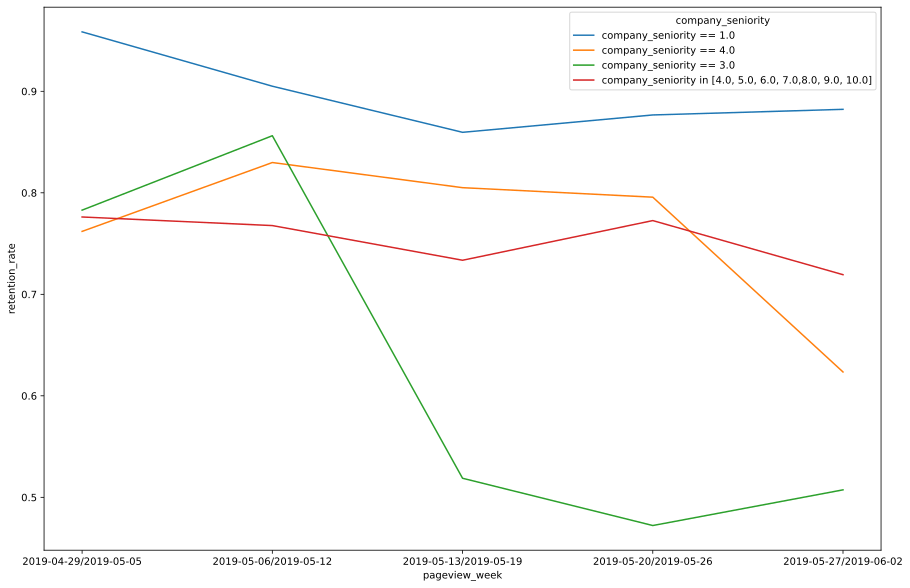

In [ ]:
import matplotlib.pyplot as plt
from mlxtend.plotting import category_scatter

fig, ax1 = plt.subplots(figsize=(15,10))
sns.lineplot(x="pageview_week", y="retention_rate", hue="company_seniority",  data=mater_retention)


## 3.4 Daily Retention

In [ ]:
#identify which users are active by looking at their pageviews per month
user_pageview = df.groupby(['datadog_user_id','pageview_date'])['pageview_id'].nunique().reset_index()

#create retention matrix with crosstab
retention = pd.crosstab(user_pageview['datadog_user_id'], 
                        user_pageview['pageview_date'],values=user_pageview['pageview_id'], aggfunc='sum').reset_index()
retention.fillna(0, inplace=True)
retention.head()

pageview_date,datadog_user_id,2019-04-15,2019-04-16,2019-04-17,2019-04-18,2019-04-19,2019-04-20,2019-04-21,2019-04-22,2019-04-23,2019-04-24,2019-04-25,2019-04-26,2019-04-27,2019-04-28,2019-04-29,2019-04-30,2019-05-01,2019-05-02,2019-05-03,2019-05-04,2019-05-05,2019-05-06,2019-05-07,2019-05-08,2019-05-09,2019-05-10,2019-05-11,2019-05-12,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22,2019-05-23,2019-05-24,2019-05-25,2019-05-26,2019-05-27,2019-05-28,2019-05-29,2019-05-30,2019-05-31,2019-06-01,2019-06-02
0,000caba64e7d179961013ff5cdbabda144f21b2ace4735...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,001d6867a8be9dc06125ace1579c2fdd3159d6bf45cf74...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,00207f5b195b1da3472f3f5eaeef3ee275dcc09a565f77...,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,00288622e92eaaf41b43ecb702c3426445f12c28981eb4...,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,00294194a5726bec2f091b98d75b3f01e9b3cefdf53dc2...,0.0,5.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#create an array of dictionary which keeps Retained & Total User count for each month
days = retention.columns[2:]
retention_array = []
for i in range(len(days)-1):
    retention_data = {}
    selected_day = days[i+1]
    #print(selected_day)
    prev_day = days[i]
    retention_data['pageview_date'] = selected_day
    retention_data['total_user_count'] = retention[selected_day].sum()
    retention_data['retained_user_count'] = retention[(retention[selected_day]>0) & (retention[prev_day]>0)][selected_day].sum()
    retention_array.append(retention_data)
    
#convert the array to dataframe and calculate Retention Rate
retention = pd.DataFrame(retention_array)
retention['retention_rate'] = retention['retained_user_count']/retention['total_user_count']

#plot the retention rate graph
plot_data = [
    go.Scatter(
        x=retention['pageview_date'],
        y=retention['retention_rate'],
        name="organic"
    )   
]

plot_layout = go.Layout(
        xaxis={"type": "category"},
        title='Daily Retention Rate'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)


## 3.5 Retention Table 

Retention tabls shows the users/companies are behaving in terms of retaining users at specific seniority stages

In [ ]:
df_min_max.min_pageview_date = pd.to_datetime(df_min_max.min_pageview_date, format='%Y/%m/%d')
df_min_max.pageview_date = pd.to_datetime(df_min_max.pageview_date, format='%Y/%m/%d')

df_min_max['seniority'] = (df_min_max['pageview_date'] - df_min_max['min_pageview_date']).dt.days + 1

group = df_min_max.groupby(['min_pageview_date', 'seniority'])
cohort_data = group['company_id'].nunique()
cohort_data = cohort_data.reset_index()

cohort_counts = cohort_data.pivot(index='min_pageview_date', columns='seniority', values='company_id')

# We need the base for our retention rate calculation
# Here we just take the first column of cohort_counts
base = cohort_counts[1]

# And now we apply the divide method to our cohort_counts, dividing it by the base
retention = cohort_counts.divide(base, axis=0).round(3)

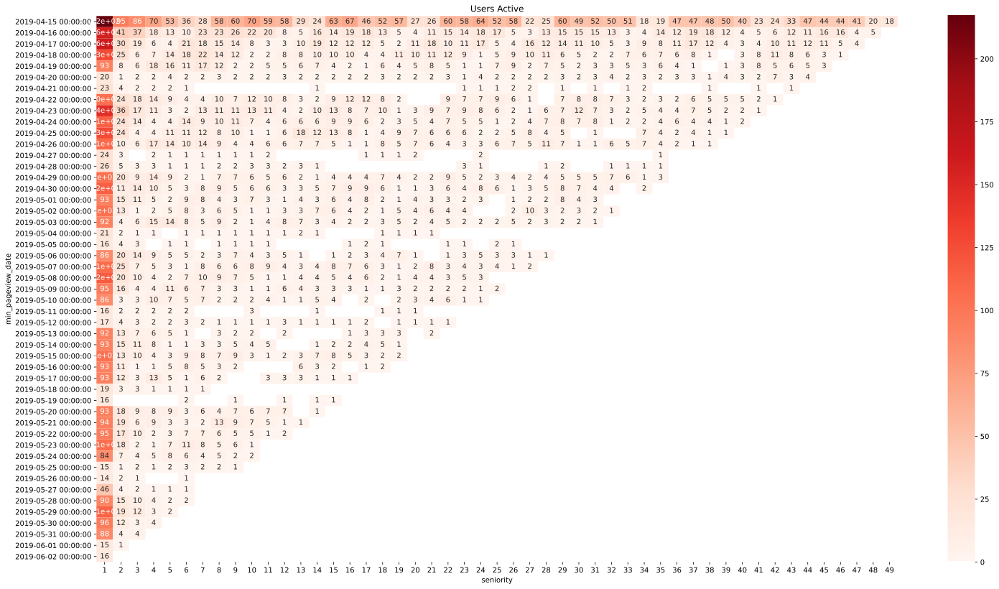

In [ ]:
# User Count heatmap
plt.figure(figsize=(25,14))
plt.title('Users Active')
ax = sns.heatmap(data=cohort_counts, annot=True, vmin=0.0,cmap='Reds')
ax.set_yticklabels(cohort_counts.index)
fig=ax.get_figure()
fig.savefig("Retention Counts.png")
plt.show()

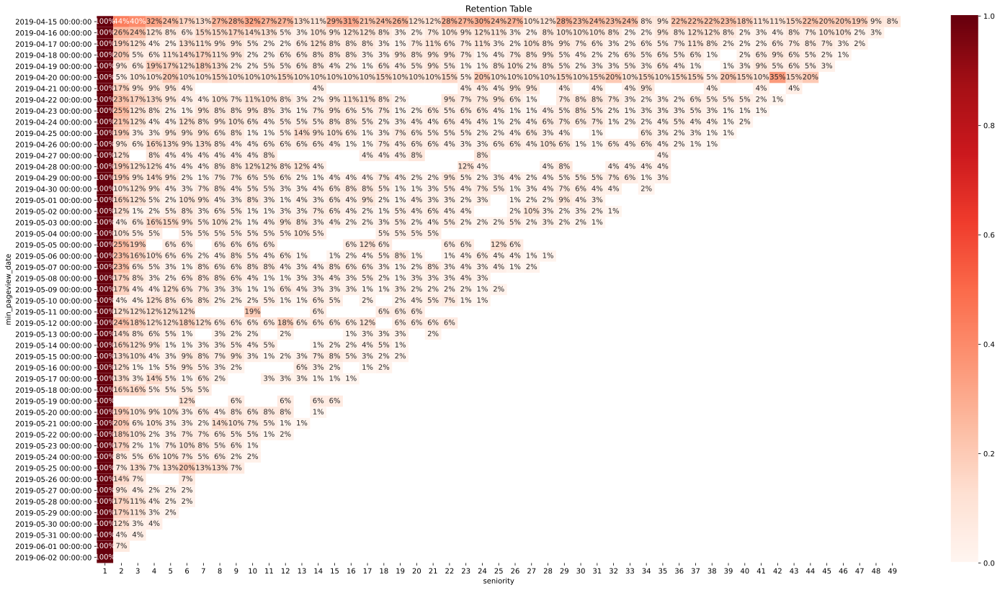

In [ ]:
# Retention Rate heatmap
plt.figure(figsize=(25,14))
plt.title('Retention Table')
ax = sns.heatmap(data=retention, annot=True, fmt='.0%', vmin=0.0, vmax=1,cmap='Reds')
ax.set_yticklabels(retention.index)
fig=ax.get_figure()
fig.savefig("Retention_Rate.png")

plt.show()

## 3.6 Distribution of of url/user per company over time.

Through analyzing the distribution of url per company over time, conclusion are below:

1. Companies with high pageviews reduced their pageviews starting 5/10/2019.
2. Companies accessing large number of urls had viewed far less urls starting 5/10/2019. 
3. Number of urls has a positive correlation with pageviews. The avgerage view per url decreased from 1.25 to 1.1 from April to May. 
4. The ratio of user per company  stay relatively unchanged. 

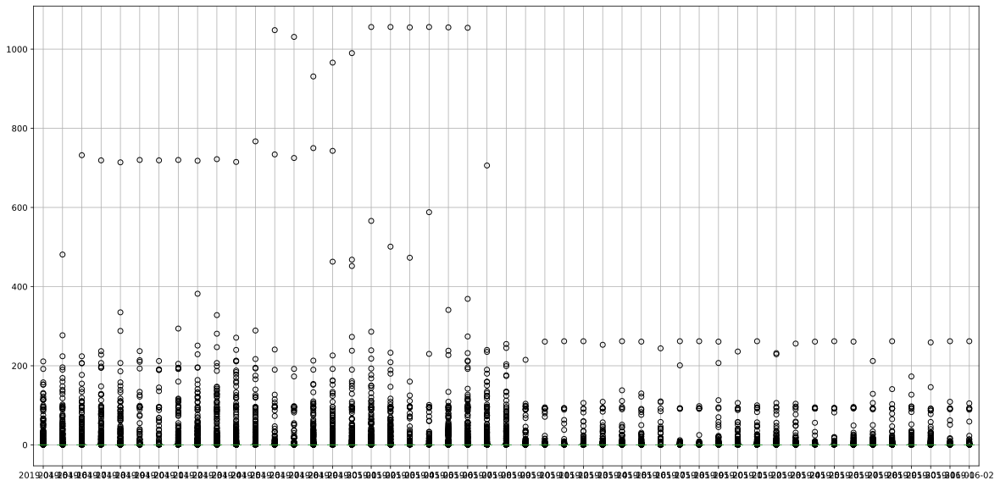

In [ ]:
#distribution of active pageview per company 
#create retention matrix with crosstab
re_pc = pd.crosstab(df['company_id'], df['pageview_date']).reset_index()

plt.figure(figsize=(20,10))
re_pc.boxplot()
plt.show()
#for i,d in enumerate(re_url_pc):
#    y = re_url_pc[d]
#    x = np.random.normal(i+1, 0.04, len(y))
#    plt.plot(x, y, mec='k', ms=7, marker="o", linestyle="None")

#plt.hlines(1,0,4,linestyle="--")

In [ ]:
a=re_pc[(re_pc.iloc[:, 1:] > 300).any(1)]
a
#a.tolist()
#df_test = df[~df['datadog_user_id'].isin(a)]

#fig = px.histogram(df_test, x="pageview_date", y="pageview_id", histfunc="count", title="Histogram on Date Axes")
#fig.update_layout(bargap=0.1)
#fig.show()

pageview_date,company_id,2019-04-15,2019-04-16,2019-04-17,2019-04-18,2019-04-19,2019-04-20,2019-04-21,2019-04-22,2019-04-23,2019-04-24,2019-04-25,2019-04-26,2019-04-27,2019-04-28,2019-04-29,2019-04-30,2019-05-01,2019-05-02,2019-05-03,2019-05-04,2019-05-05,2019-05-06,2019-05-07,2019-05-08,2019-05-09,2019-05-10,2019-05-11,2019-05-12,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22,2019-05-23,2019-05-24,2019-05-25,2019-05-26,2019-05-27,2019-05-28,2019-05-29,2019-05-30,2019-05-31,2019-06-01,2019-06-02
353,31d6e5c7011f0020a4468f4008d01db38b25187bba3134...,0,0,0,0,0,0,0,0,0,0,13,289,1048,1031,931,966,990,1056,1056,1055,1056,1055,1054,706,84,3,3,3,4,3,3,3,3,4,3,3,3,4,8,1,0,0,0,0,0,0,2,0,0
836,78db7f88678a4e7e7c43246cd4c6e4efec4e30f56181e8...,114,160,177,195,335,214,88,294,382,328,212,166,127,86,213,463,452,566,501,473,588,341,369,235,255,104,71,0,5,7,5,6,46,201,25,207,36,47,232,104,33,17,6,14,141,127,87,62,59
1095,9c62fc31f992e53eb9d965e9dcbd08bc215030db233af0...,20,481,732,719,714,720,719,720,718,722,715,767,734,725,750,743,468,64,47,27,33,68,196,150,204,36,10,2,14,16,9,21,30,9,4,15,21,26,42,18,6,6,17,16,9,15,58,15,7


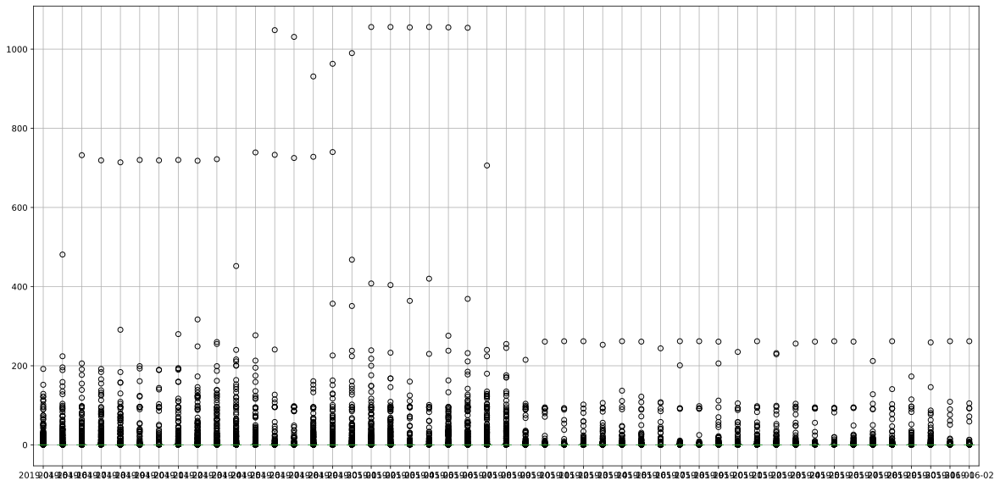

In [ ]:
#distribution of number of active url per company 
#identify which users per company
url_per_company = df.groupby(['company_id','pageview_date'])['page_url'].nunique().reset_index()
#create retention matrix with crosstab
re_pc = pd.crosstab(url_per_company['company_id'], url_per_company['pageview_date'],
                         values=url_per_company['page_url'], aggfunc='sum').reset_index()
re_pc.fillna(0, inplace=True)
re_pc.head()

plt.figure(figsize=(20,10))
re_pc.boxplot()
plt.show()

In [ ]:
#graph active url per company on a daily basis
url_per_comp_per_day=df.groupby(['pageview_date'])['company_id','page_url'].nunique().reset_index()
url_per_comp_per_day['url_per_comp']=url_per_comp_per_day['page_url']/url_per_comp_per_day['company_id']
plot_daily(url_per_comp_per_day, 'url_per_comp')


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



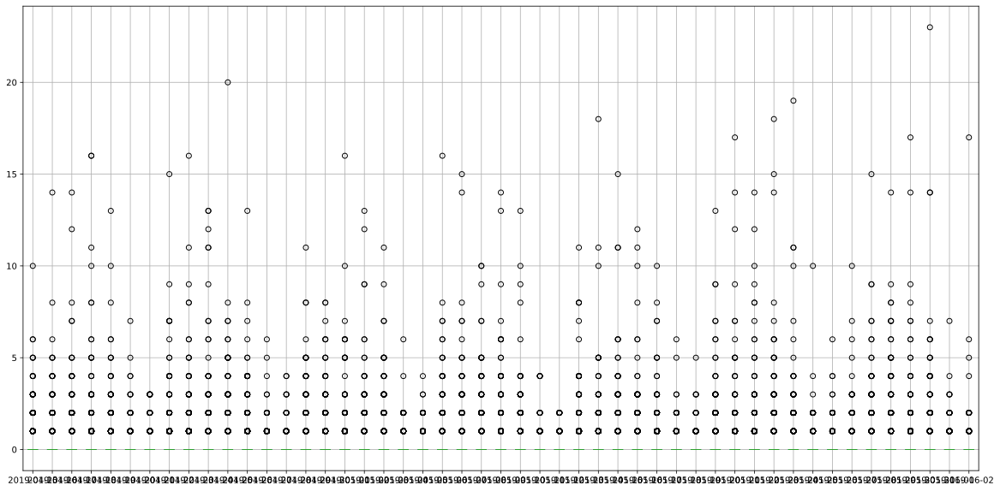

In [ ]:
#graph active user per company 
user_per_company = df.groupby(['company_id','pageview_date'])['datadog_user_id'].nunique().reset_index()
#user_per_company
#create retention matrix with crosstab
re_pc = pd.crosstab(user_per_company['company_id'], user_per_company['pageview_date'],
                         values=user_per_company['datadog_user_id'], aggfunc='sum').reset_index()
re_pc.fillna(0, inplace=True)
re_pc.head()

plt.figure(figsize=(20,10))
re_pc.boxplot()
plt.show()

# 4.Time Series Clustering

## 4.1 Hierarchical Clustering Dendrogram

Hierarchical Clustering recursively merges the pair of clusters that minimally increases a given linkage distance.
Here we use the default euclidean metric to compute the linkage.

documentation: https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.fcluster.html

In [ ]:
# dynamic time warping
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import fcluster, ward, dendrogram

In [ ]:
test=df.groupby(['pageview_date','datadog_user_id'])[ 'pageview_id'].nunique().reset_index() 
dt_df=pd.crosstab( test['datadog_user_id'], test['pageview_date'],  values=test['pageview_id'],aggfunc='sum').reset_index()
dt_df.fillna(0, inplace=True)
dt_df.set_index('datadog_user_id', inplace=True)
dt_df.head()

pageview_date,2019-04-15,2019-04-16,2019-04-17,2019-04-18,2019-04-19,2019-04-20,2019-04-21,2019-04-22,2019-04-23,2019-04-24,2019-04-25,2019-04-26,2019-04-27,2019-04-28,2019-04-29,2019-04-30,2019-05-01,2019-05-02,2019-05-03,2019-05-04,2019-05-05,2019-05-06,2019-05-07,2019-05-08,2019-05-09,2019-05-10,2019-05-11,2019-05-12,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22,2019-05-23,2019-05-24,2019-05-25,2019-05-26,2019-05-27,2019-05-28,2019-05-29,2019-05-30,2019-05-31,2019-06-01,2019-06-02
datadog_user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
006cc28c74ca6df297daf778a0b2eb79542bc253fb876f7dcfffa4bbef9d86aa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
007b70c6497556d82f5aae5da559f036e4221ec940fffc0364ff8198e7ea13f8,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0083fe15cd394bab1d196f6b19a002f8f35eed743105d90269de61b4abc34532,96.0,95.0,94.0,95.0,96.0,96.0,95.0,96.0,96.0,96.0,64.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
00f4a3cf37deb194cc7bc6b93a50c65cf3ecc90227bcfa4889624820995916b2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
018499c257805dc49ae5aaf82bc28184fde74969b86b877bb43a059dec1435f9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
# heirarchical clustering of scales weekly item sales. 
clf = AgglomerativeClustering(n_clusters=None, distance_threshold = 0).fit(dt_df.values)

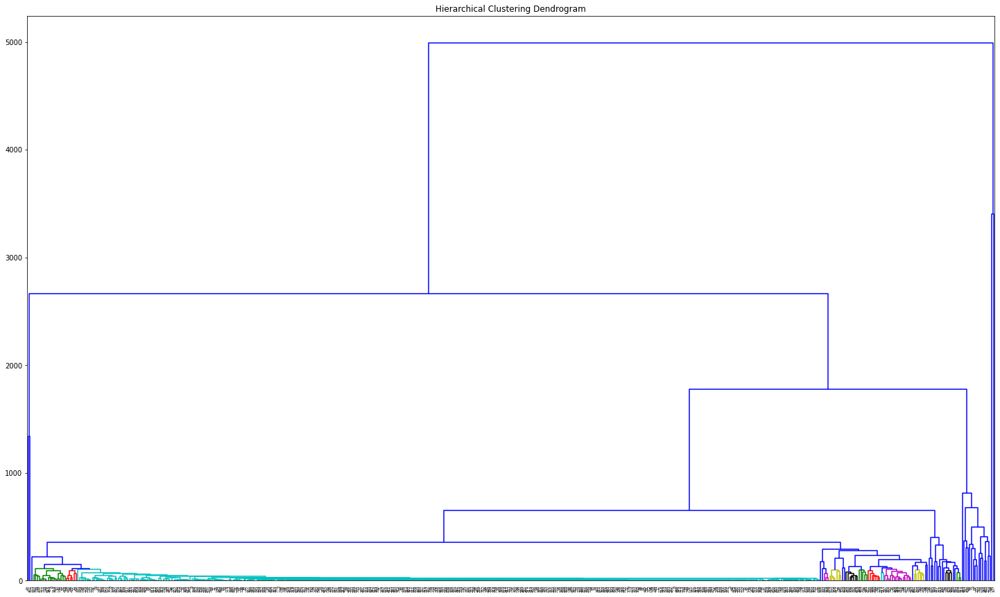

In [ ]:
# given a linkage model, plog dendogram, with the colors indicated by the a cutoff point at which we define clusters
def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram

    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, **kwargs)
    return linkage_matrix

plt.figure(figsize = (25,15))
plt.title('Hierarchical Clustering Dendrogram')
# plot the top three levels of the dendrogram
Z = plot_dendrogram(clf, p=5, color_threshold = 110)
plt.show()

In [ ]:
# extract clusters from dendogram
clusters = fcluster(Z, 100, criterion='distance')
# create a lookup table for series in a given cluster
dt_df_clustered = dt_df
dt_df_clustered["cluster"] = clusters
dt_df_clustered.head()

pageview_date,2019-04-15,2019-04-16,2019-04-17,2019-04-18,2019-04-19,2019-04-20,2019-04-21,2019-04-22,2019-04-23,2019-04-24,2019-04-25,2019-04-26,2019-04-27,2019-04-28,2019-04-29,2019-04-30,2019-05-01,2019-05-02,2019-05-03,2019-05-04,2019-05-05,2019-05-06,2019-05-07,2019-05-08,2019-05-09,2019-05-10,2019-05-11,2019-05-12,2019-05-13,2019-05-14,2019-05-15,2019-05-16,2019-05-17,2019-05-18,2019-05-19,2019-05-20,2019-05-21,2019-05-22,2019-05-23,2019-05-24,2019-05-25,2019-05-26,2019-05-27,2019-05-28,2019-05-29,2019-05-30,2019-05-31,2019-06-01,2019-06-02,cluster
datadog_user_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
006cc28c74ca6df297daf778a0b2eb79542bc253fb876f7dcfffa4bbef9d86aa,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,21.0,0.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
007b70c6497556d82f5aae5da559f036e4221ec940fffc0364ff8198e7ea13f8,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
0083fe15cd394bab1d196f6b19a002f8f35eed743105d90269de61b4abc34532,96.0,95.0,94.0,95.0,96.0,96.0,95.0,96.0,96.0,96.0,64.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,43
00f4a3cf37deb194cc7bc6b93a50c65cf3ecc90227bcfa4889624820995916b2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6
018499c257805dc49ae5aaf82bc28184fde74969b86b877bb43a059dec1435f9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6


## 4.2 KMeans Clustering using DTW 

KMeans Clustering using DTW distance is to identify customer clusters that contributed to the pageview decline in early May. By grouping their time series pageview behaviors, we identify 7 customer clusters have drastic pageview decrease in early May.

Documentation: https://tslearn.readthedocs.io/en/stable/auto_examples/clustering/plot_kmeans.html#sphx-glr-auto-examples-clustering-plot-kmeans-py

In [ ]:
#!pip install tslearn
from tslearn.clustering import TimeSeriesKMeans, KShape, KernelKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance
import matplotlib.pyplot as plt

In [ ]:
# inputs
n_charts = None # If None then pull data for all charts otherwise sample n_charts randomly
n_clusters = 20 # number of clusters to fit
diff = False # take diffs of the data or not
preprocessing_meanvar = False # True to use TimeSeriesScalerMeanVariance preprocessing
smooth_n = 15 # n observations to smooth over
smooth_func = 'mean' # one of ['mean','min','max','sum']
norm = True # normalize the data to 0-1 range
model = 'dtw' # one of ['kmeans','kshape','kernelkmeans','dtw']

In [ ]:
test=df.groupby(['pageview_date','datadog_user_id'])[ 'pageview_id'].nunique().reset_index() 
dt_df=pd.crosstab(   test['pageview_date'],test['datadog_user_id'],values=test['pageview_id'],aggfunc='sum').reset_index()
dt_df_copy=dt_df
dt_df.fillna(0, inplace=True)
dt_df.set_index('pageview_date', inplace=True)

In [ ]:
# get values to cluster on
X = dt_df.transpose().values
if preprocessing_meanvar:
    X = TimeSeriesScalerMeanVariance().fit_transform(X)
    dt_df = pd.DataFrame(X.reshape(dt_df.shape), columns=dt_df.columns, index=dt_df.index)
if model == 'kshape':
    model = KShape(n_clusters=n_clusters, max_iter=10, n_init=2).fit(X)
elif model == 'kmeans':
    model = TimeSeriesKMeans(n_clusters=n_clusters, metric="euclidean", max_iter=10, n_init=2).fit(X)
elif model == 'dtw':
    model = TimeSeriesKMeans(n_clusters=n_clusters, metric="dtw", max_iter=5, n_init=2).fit(X)
elif model == 'kernelkmeans':
    model = KernelKMeans(n_clusters=n_clusters, kernel="gak", max_iter=5, n_init=2).fit(X)
else:
    model = TimeSeriesKMeans(n_clusters=n_clusters, metric="euclidean", max_iter=10, n_init=2).fit(X)

In [ ]:
# build helper df to map metrics to their cluster labels
df_cluster = pd.DataFrame(list(zip(dt_df.columns, model.labels_)), columns=['metric', 'cluster'])

# make some helper dictionaries and lists
cluster_metrics_dict = df_cluster.groupby(['cluster'])['metric'].apply(lambda x: [x for x in x]).to_dict()
cluster_len_dict = df_cluster['cluster'].value_counts().to_dict()
clusters_dropped = [cluster for cluster in cluster_len_dict if cluster_len_dict[cluster]==1]
clusters_final = [cluster for cluster in cluster_len_dict if cluster_len_dict[cluster]>1]
clusters_final.sort()

df_cluster.head()

,metric,cluster
0,006cc28c74ca6df297daf778a0b2eb79542bc253fb876f...,11
1,007b70c6497556d82f5aae5da559f036e4221ec940fffc...,11
2,0083fe15cd394bab1d196f6b19a002f8f35eed743105d9...,10
3,00f4a3cf37deb194cc7bc6b93a50c65cf3ecc90227bcfa...,0
4,018499c257805dc49ae5aaf82bc28184fde74969b86b87...,11


## Final 167 users clustering

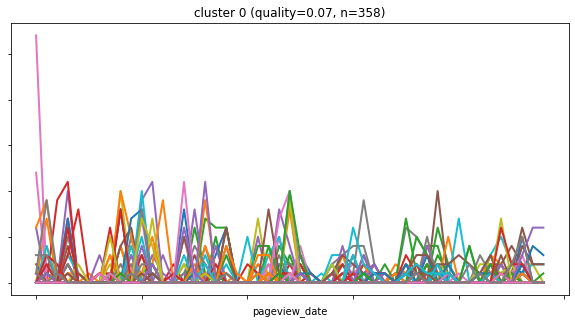

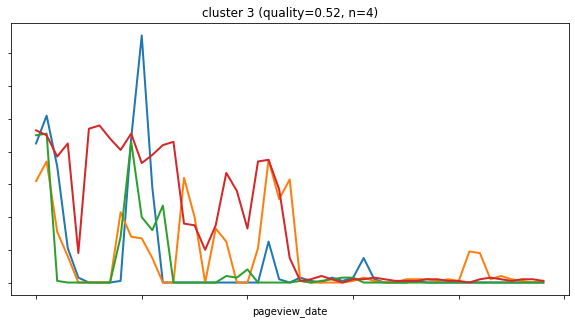

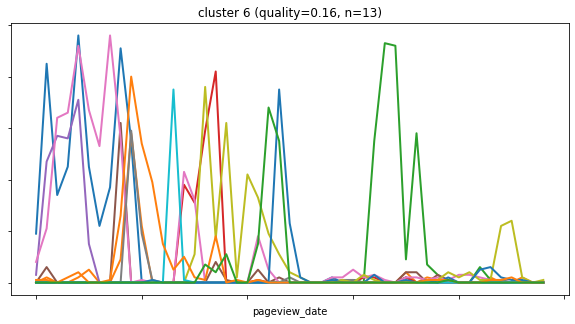

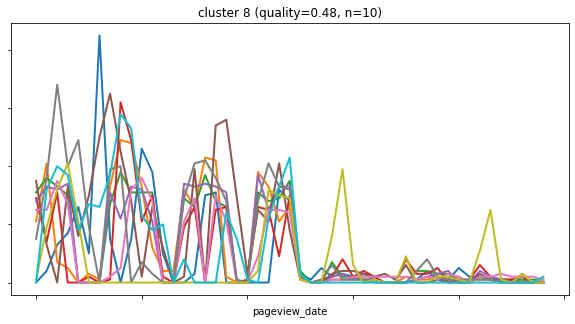

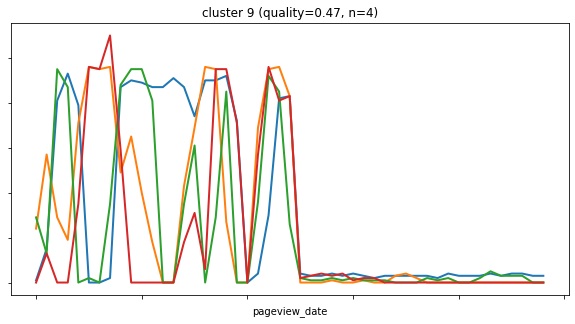

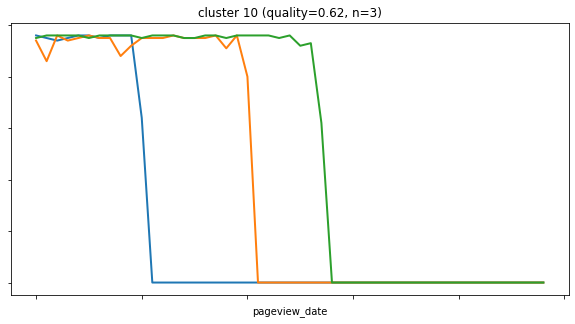

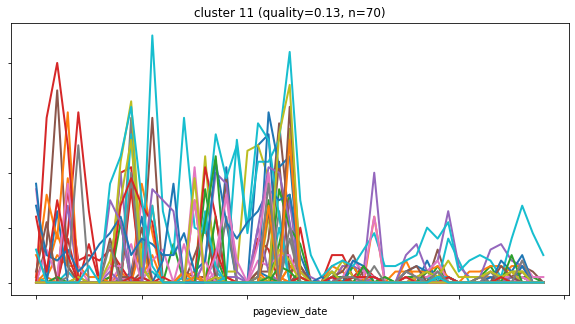

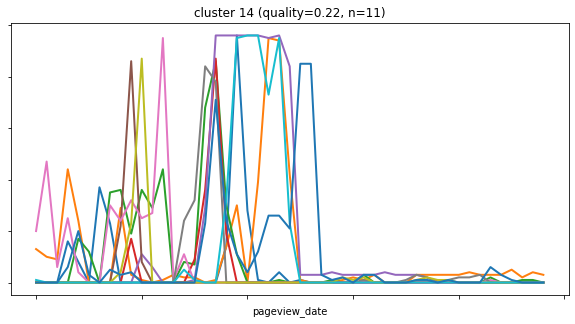

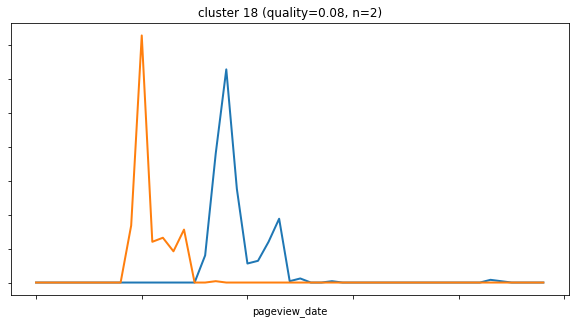

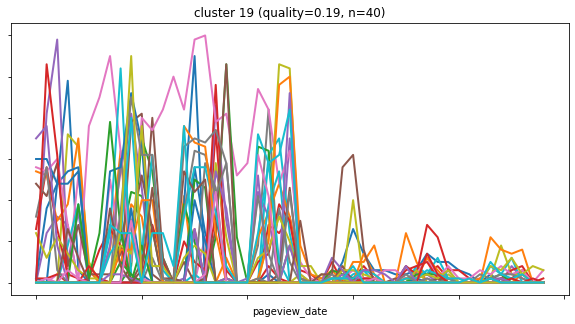

In [ ]:
for cluster_number in clusters_final:
    # get a rough quality score based on the correlation between metrics in the cluster
    x_corr = dt_df[cluster_metrics_dict[cluster_number]].corr().abs().values
    x_corr_mean = round(x_corr[np.triu_indices(x_corr.shape[0],1)].mean(),2)
    # plot each cluster
    plot_title = f'cluster {cluster_number} (quality={x_corr_mean}, n={cluster_len_dict[cluster_number]})'

    test_cluster=cluster_metrics_dict[cluster_number]
    ax = dt_df[test_cluster].plot(linewidth=2, fontsize=12,figsize=(10, 5))
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.get_legend().remove()
    ax.title.set_text(plot_title)

In [ ]:
#identify all the users that are not in cluster 1 or 19. 
#Those user have contribited to the pageview decrease, according to the clustering graph above.
number_of_users=0
users_list=[]
for key in cluster_metrics_dict.items():
  print( key[1])
  if len(key[1])!=1 or key[0] != 0 or key[0] != 11  or key[0] != 6:
    users_list.append(key)
    number_of_users+=len(key[1])
    


['cbbf60e55f37b865a16901ff5e6dbcf51e8b19b311fa846318273b7dd47eae27']
['1464d31e3038f63412c8c564d89af10321fbb927ad3a6c281dbbbef8766b39dd']
['9f5df47b1461e9dc74794206548c6671e5a7c54da0e3ba8d222ba5452bf5b1aa', 'bec190bb9fd4b3efae7b6bc4a302fa89806de3c559185e1349020f172f40d695', 'cf802b641a5be75037e486e3be030df3d39cd17a2634c61dba1038bb1c76123f', 'ffc0431fcb60409f82795304a70d387672c291135d600764e974feabebcd0f36']
['121e386b6aa9f259fc433b572d5ad5b9d3f4d9af9ad1eff31e9da48da78a4693']
['34b3e9416667cbc4b3614fd5ab687689ef126f03d49c42b9ec12ef46d8afc5fe']
['27cb0d06fbdd33f05c12095fc81cc77a3b7ae5735a36bb1e2ed451295280f9ac', '4f41c4dad099dbba080c675e94d8e14d4f55e40831fc3e3f6d376e13c8c4f0b0', '5037d9458b230c2bac43cb1166475766e8e79195e26a360f3748fe67229d7a06', '514724123f3778696371dfb419f06d23b582c15898fc8f447724012c0ae3e5dd', '5cc9c578935e809d144dba704e8d6165e639101ff82e92f9a07b6e5e02f49a8f', '607d4add477e2577164eb9eb769fefc33bf5374a04fdd317688519818ae2843b', '6d3266f3cda487f9199d0213434c53a2eed48836f

In [ ]:
number_of_users

167

The End

In [ ]:
!jupyter nbconvert --to pdf CharleneDatadogQ2.ipynb

[NbConvertApp] Converting notebook CharleneDatadogQ2.ipynb to pdf
/usr/local/lib/python2.7/dist-packages/nbconvert/filters/datatypefilter.py:41: UserWarning: Your element with mimetype(s) [u'text/html'] is not able to be represented.
  mimetypes=output.keys())
[NbConvertApp] Support files will be in CharleneDatadogQ2_files/
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./CharleneDatadogQ2_files
[NbConvertApp] Making directory ./Ch